# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('./train_data.csv')
resource_data = pd.read_csv('./resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [5]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]

#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)

# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]

project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [6]:
project_grade_category = []
for i in range(len(project_data)):
    a = project_data["project_grade_category"][i].replace(" ", "_") 
    project_grade_category.append(a)

In [7]:
project_grade_category[0:5]

['Grades_PreK-2', 'Grades_6-8', 'Grades_6-8', 'Grades_PreK-2', 'Grades_PreK-2']

In [8]:
project_data.drop(['project_grade_category'], axis=1, inplace=True)

In [9]:
project_data["project_grade_category"] = project_grade_category

In [10]:
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Grades_PreK-2
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,Grades_6-8
51140,74477,p189804,4a97f3a390bfe21b99cf5e2b81981c73,Mrs.,CA,2016-04-27 00:46:53,Literacy & Language,Literacy,Mobile Learning with a Mobile Listening Center,Having a class of 24 students comes with diver...,I have a class of twenty-four kindergarten stu...,By having a mobile listening and storage cente...,A mobile listening center will help keep equip...,My students need a mobile listening center to ...,10,1,Grades_6-8
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Applied Learning,Early Development,Flexible Seating for Flexible Learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,We need a classroom rug that we can use as a c...,"Benjamin Franklin once said, \""Tell me and I f...",My students need flexible seating in the class...,2,1,Grades_PreK-2
41558,33679,p137682,06f6e62e17de34fcf81020c77549e1d5,Mrs.,WA,2016-04-27 01:05:25,Literacy & Language,Literacy,Going Deep: The Art of Inner Thinking!,"My students crave challenge, they eat obstacle...","We are an urban, public k-5 elementary school....",With the new common core standards that have b...,These remarkable gifts will provide students w...,My students need copies of the New York Times ...,2,1,Grades_PreK-2


## 1.2 preprocessing of `project_subject_categories`

In [11]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [12]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [13]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [14]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category,clean_categories,clean_subcategories,essay
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Grades_PreK-2,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,Grades_6-8,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


### Splitting data into Train and cross validation(or test): Stratified Sampling

In [15]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(project_data, project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [16]:
X_train.drop(['project_is_approved'], axis=1, inplace=True) 
X_test.drop(['project_is_approved'], axis=1, inplace=True) 
X_cv.drop(['project_is_approved'], axis=1, inplace=True)

In [17]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement these kits: magnets, motion, si

In [18]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [19]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

\"A person is a person, no matter how small.\" (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed. \r\nStudents in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.\r\nOur school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the ear

In [20]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

 A person is a person, no matter how small.  (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed.   Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.  Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the early chi

In [21]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

 A person is a person no matter how small Dr Seuss I teach the smallest students with the biggest enthusiasm for learning My students learn in many different ways using all of our senses and multiple intelligences I use a wide range of techniques to help all my students succeed Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures including Native Americans Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom Kindergarteners in my class love to work with hands on materials and have many different opportunities to practice a skill before it is mastered Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum Montana is the perfect place to learn about agriculture and nutrition My students love to role play in our pretend kitchen in the early childhood classroom

In [22]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

### 1.3.1 Preprocessed Train data (Text)

In [23]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays_train = []
# tqdm is for printing the status bar
for sentance in tqdm(X_train['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays_train.append(sent.lower().strip())

100%|██████████| 49041/49041 [00:32<00:00, 1507.36it/s]


In [24]:
# after preprocesing
preprocessed_essays_train[20000]

'i opportunity support inspire 60 students come school every day hopes learning no less academics also 100 students native language not english work hard every day learn second language my english language learners ells overall learning styles vary greatly some students read write fluently native language english others come limited literacy skills require creative approaches transition english language some kids need keep moving their muscles crave activity making difficult sit still long periods time focus seated activities flexible seating lets kids move adjust non disruptive way burn excess energy get stimulus muscles looking making attentive class studies suggest children participate short bouts physical activity within classroom task behavior best improvement seen students least task initially as i slowly incorporated flexible active seating within classroom i already seen difference students what struggle keep attention instruction found outlet fidgeting task nannan'

### 1.3.2 Preprocessed Test data (Text)¶

In [25]:
preprocessed_essays_test = []
# tqdm is for printing the status bar
for sentence in tqdm(X_test['essay'].values):
    sent = decontracted(sentence)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_test.append(sent.lower().strip())

100%|██████████| 36052/36052 [00:24<00:00, 1497.84it/s]


In [26]:
# after preprocesing
preprocessed_essays_test[2000]

'students inner city smarties despite hardships little lives come school smiles faces students low income homes many parents work two three jobs kids home taking care many not two parent homes students immigrant families struggling survive country despite students bring little smiles school everyday even things seem falling apart home come school eager learn fun teacher students low income high poverty school district students faced several challenges classroom despite many challenges face looking keep things simple provide students meaningful learning experiences students enthuastic 1st graders eager learn read many non english speakers see excitement faces book read project laptop make possible provide students audio visual representation material used lcd projector students loss visual connection means loss attention loss information students need kept actively engaged due fact difficulty english language technology help design learning environment fun interactive engaging struggle 

### 1.3.3 Preprocessed Cross Validation data (Text)

In [27]:
preprocessed_essays_cv = []
# tqdm is for printing the status bar
for sentence in tqdm(X_cv['essay'].values):
    sent = decontracted(sentence)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays_cv.append(sent.lower().strip())

100%|██████████| 24155/24155 [00:16<00:00, 1507.00it/s]


In [28]:
# after preprocesing
preprocessed_essays_cv[2000]

'students second third graders special needs including autism intellectual disability speech language impairments specific learning disabilities health impairments classroom self contained special education class public school irvine california students enjoy learning academics well functional living skills work hard throughout day traditional curricular areas language arts math social studies science however also enjoy practicing fine gross motor listening social skills students included within general education setting recess lunch assemblies field trips pe music highlight job seeing integrated accepted general education peers students enjoy learning concepts science particularly opportunity involved hands learning experience year study life cycle plants including materials need grow survive reproduce generous donation towards project help students study science curriculum fun interactive functional way students need materials planters soil seeds tools grow maintain outdoor garden ga

<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [29]:
# similarly you can preprocess the titles also
# printing some random titles.
print(project_data['project_title'].values[0])
print("="*50)
print(project_data['project_title'].values[170])
print("="*50)
print(project_data['project_title'].values[5005])
print("="*50)
print(project_data['project_title'].values[40000])
print("="*50)
print(project_data['project_title'].values[99998])
print("="*50)

Engineering STEAM into the Primary Classroom
Changing Perspectives with Nonfiction
Chris Van Allsburg Author Study
Gear for Great Kids!
We Are Learning To Express Ourselves With Creativity!!


### 1.4.1 Preprocessing of Project Title for Train data¶

In [30]:
preprocessed_titles_train = []
# tqdm is for printing the status bar
for titles in tqdm(X_train['project_title']):
    title = decontracted(titles)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    # https://gist.github.com/sebleier/554280
    title = ' '.join(f for f in title.split() if f not in stopwords)
    preprocessed_titles_train.append(title.lower().strip())

100%|██████████| 49041/49041 [00:01<00:00, 29609.84it/s]


In [31]:
# after preprocesing
preprocessed_titles_train[5005]

'increasing literacy with laptop'

### 1.4.2 Preprocessing of Project Title for Test data

In [32]:
preprocessed_titles_test = []
# tqdm is for printing the status bar
for titles in tqdm(X_test['project_title']):
    title = decontracted(titles)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    # https://gist.github.com/sebleier/554280
    title = ' '.join(f for f in title.split() if f not in stopwords)
    preprocessed_titles_test.append(title.lower().strip())

100%|██████████| 36052/36052 [00:01<00:00, 29153.03it/s]


In [33]:
# after preprocesing
preprocessed_titles_test[5000]

'tangled tongues floppy fingers'

### 1.4.3 Preprocessing of Project Title for Cross Validation data

In [34]:
preprocessed_titles_cv = []
# tqdm is for printing the status bar
for titles in tqdm(X_cv['project_title']):
    title = decontracted(titles)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    # https://gist.github.com/sebleier/554280
    title = ' '.join(f for f in title.split() if f not in stopwords)
    preprocessed_titles_cv.append(title.lower().strip())

100%|██████████| 24155/24155 [00:00<00:00, 29476.91it/s]


In [35]:
# after preprocesing
preprocessed_titles_cv[3000]

'get moving first grade'

## 1.5 Preparing data for models

In [36]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_title', 'project_essay_1', 'project_essay_2',
       'project_essay_3', 'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'project_grade_category', 'clean_categories', 'clean_subcategories',
       'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

In [36]:
# we use count vectorizer to convert the values into one 
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_cat = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)

vectorizer_cat.fit(X_train['clean_categories'].values)

categories_one_hot_train = vectorizer_cat.transform(X_train['clean_categories'].values)
categories_one_hot_test = vectorizer_cat.transform(X_test['clean_categories'].values)
categories_one_hot_cv = vectorizer_cat.transform(X_cv['clean_categories'].values)

print(vectorizer_cat.get_feature_names())

print("Shape of matrix of Train data after one hot encodig ",categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encodig ",categories_one_hot_test.shape)
print("Shape of matrix of CV data after one hot encodig ",categories_one_hot_cv.shape)

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix of Train data after one hot encodig  (49041, 9)
Shape of matrix of Test data after one hot encodig  (36052, 9)
Shape of matrix of CV data after one hot encodig  (24155, 9)


### One Hot Encode - Clean Sub-Categories of Projects

In [37]:
# we use count vectorizer to convert the values into one 
vectorizer_sub_cat = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_sub_cat.fit(X_train['clean_subcategories'].values)

sub_categories_one_hot_train = vectorizer_sub_cat.transform(X_train['clean_subcategories'].values)
sub_categories_one_hot_test = vectorizer_sub_cat.transform(X_test['clean_subcategories'].values)
sub_categories_one_hot_cv = vectorizer_sub_cat.transform(X_cv['clean_subcategories'].values)

print(vectorizer_sub_cat.get_feature_names())

print("Shape of matrix of Train data after one hot encodig ",sub_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encodig ",sub_categories_one_hot_test.shape)
print("Shape of matrix of CV data after one hot encodig ",sub_categories_one_hot_cv.shape)

['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix of Train data after one hot encodig  (49041, 30)
Shape of matrix of Test data after one hot encodig  (36052, 30)
Shape of matrix of CV data after one hot encodig  (24155, 30)


### One Hot Encode - School States

In [38]:
my_counter = Counter()
for state in project_data['school_state'].values:
    my_counter.update(state.split())

In [39]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
school_state_cat_dict = dict(my_counter)
sorted_school_state_cat_dict = dict(sorted(school_state_cat_dict.items(), key=lambda kv: kv[1]))

In [40]:
# we use count vectorizer to convert the values into one hot encoded features
#Categorized school_state
vectorizer_school_state = CountVectorizer(vocabulary=list(sorted_school_state_cat_dict.keys()), lowercase=False, binary=True)

vectorizer_school_state.fit(X_train['school_state'].values)

school_state_categories_one_hot_train = vectorizer_school_state.transform(X_train['school_state'].values) 
school_state_categories_one_hot_test = vectorizer_school_state.transform(X_test['school_state'].values) 
school_state_categories_one_hot_cv = vectorizer_school_state.transform(X_cv['school_state'].values)

print(vectorizer_school_state.get_feature_names())

print("Shape of matrix of Train data after one hot encodig ",school_state_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encodig ",school_state_categories_one_hot_test.shape)
print("Shape of matrix of CV data after one hot encodig ",school_state_categories_one_hot_cv.shape)

['VT', 'WY', 'ND', 'MT', 'RI', 'SD', 'NE', 'DE', 'AK', 'NH', 'WV', 'ME', 'HI', 'DC', 'NM', 'KS', 'IA', 'ID', 'AR', 'CO', 'MN', 'OR', 'KY', 'MS', 'NV', 'MD', 'CT', 'TN', 'UT', 'AL', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'WA', 'MA', 'LA', 'OH', 'MO', 'IN', 'PA', 'MI', 'SC', 'GA', 'IL', 'NC', 'FL', 'NY', 'TX', 'CA']
Shape of matrix of Train data after one hot encodig  (49041, 51)
Shape of matrix of Test data after one hot encodig  (36052, 51)
Shape of matrix of CV data after one hot encodig  (24155, 51)


### One Hot Encode - Project Grade Category

In [41]:
my_counter = Counter()
for project_grade in project_data['project_grade_category'].values:
    my_counter.update(project_grade.split())

In [42]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
project_grade_cat_dict = dict(my_counter)
sorted_project_grade_cat_dict = dict(sorted(project_grade_cat_dict.items(), key=lambda kv: kv[1]))

In [43]:
# we use count vectorizer to convert the values into one hot encoded features
#Categorized project_grade_category
vectorizer_grade = CountVectorizer(vocabulary=list(sorted_project_grade_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_grade.fit(X_train['project_grade_category'].values)

project_grade_categories_one_hot_train = vectorizer_grade.transform(X_train['project_grade_category'].values)
project_grade_categories_one_hot_test = vectorizer_grade.transform(X_test['project_grade_category'].values)
project_grade_categories_one_hot_cv = vectorizer_grade.transform(X_cv['project_grade_category'].values)

print(vectorizer_grade.get_feature_names())

print("Shape of matrix of Train data after one hot encoding ",project_grade_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",project_grade_categories_one_hot_test.shape)
print("Shape of matrix of CV data after one hot encoding ",project_grade_categories_one_hot_cv.shape)

['Grades_9-12', 'Grades_6-8', 'Grades_3-5', 'Grades_PreK-2']
Shape of matrix of Train data after one hot encoding  (49041, 4)
Shape of matrix of Test data after one hot encoding  (36052, 4)
Shape of matrix of CV data after one hot encoding  (24155, 4)


### One Hot Encode - Teacher Prefix

In [44]:
project_data['teacher_prefix'].isnull().sum()

3

In [45]:
#Preprocessing of teacher_prefix
#Replacing Nan data with 'None' : https://www.geeksforgeeks.org/python-pandas-dataframe-fillna-to-replace-null-values-in-dataframe/
project_data['teacher_prefix'].fillna(" ", inplace = True)
project_data['teacher_prefix'].isnull().sum()

0

In [46]:
my_counter = Counter()
for teacher_prefix in project_data['teacher_prefix'].values:
    teacher_prefix = str(teacher_prefix)
    my_counter.update(teacher_prefix.split())

In [47]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
teacher_prefix_cat_dict = dict(my_counter)
sorted_teacher_prefix_cat_dict = dict(sorted(teacher_prefix_cat_dict.items(), key=lambda kv: kv[1]))

In [48]:
#Categorized teacher_prefix
vectorizer_teach_pre = CountVectorizer(vocabulary=list(sorted_teacher_prefix_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_teach_pre.fit(X_train['teacher_prefix'].values.astype("U"))

teacher_prefix_categories_one_hot_train = vectorizer_teach_pre.transform(X_train['teacher_prefix'].values.astype("U")) 
teacher_prefix_categories_one_hot_test = vectorizer_teach_pre.transform(X_test['teacher_prefix'].values.astype("U")) 
teacher_prefix_categories_one_hot_cv = vectorizer_teach_pre.transform(X_cv['teacher_prefix'].values.astype("U"))

print(vectorizer_teach_pre.get_feature_names())

print("Shape of matrix of Train data after one hot encoding ",teacher_prefix_categories_one_hot_train.shape)
print("Shape of matrix of Test data after one hot encoding ",teacher_prefix_categories_one_hot_test.shape)
print("Shape of matrix of CV data after one hot encoding ",teacher_prefix_categories_one_hot_cv.shape)

['Dr.', 'Teacher', 'Mr.', 'Ms.', 'Mrs.']
Shape of matrix of Train data after one hot encoding  (49041, 5)
Shape of matrix of Test data after one hot encoding  (36052, 5)
Shape of matrix of CV data after one hot encoding  (24155, 5)


### 1.5.2 Vectorizing Text data

### A) BoW

#### 1.5.2.1 Bag of words - Train - Essays

In [50]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer_essay = CountVectorizer(min_df=10)
vectorizer_essay.fit(preprocessed_essays_train)

text_bow_train = vectorizer_essay.transform(preprocessed_essays_train)
print("Shape of matrix after one hot encodig ",text_bow_train.shape)

Shape of matrix after one hot encodig  (49041, 12157)


#### 1.5.2.2 BoW - Test Data - Essays

In [51]:
text_bow_test = vectorizer_essay.transform(preprocessed_essays_test) 
print("Shape of matrix after one hot encoding ",text_bow_test.shape)

Shape of matrix after one hot encoding  (36052, 12157)


#### 1.5.2.3 BoW - Cross Validation Data - Essays

In [52]:
text_bow_cv = vectorizer_essay.transform(preprocessed_essays_cv) 
print("Shape of matrix after one hot encoding ",text_bow_cv.shape)

Shape of matrix after one hot encoding  (24155, 12157)


#### 1.5.2.4 BoW - Train Data - Titles

In [53]:
vectorizer_bow_title = CountVectorizer(min_df=10)
vectorizer_bow_title.fit(preprocessed_titles_train)

title_bow_train = vectorizer_bow_title.transform(preprocessed_titles_train) 
print("Shape of matrix after one hot encoding ",title_bow_train.shape)

Shape of matrix after one hot encoding  (49041, 2090)


#### 1.5.2.5 BoW - Test Data - Titles

In [54]:
title_bow_test = vectorizer_bow_title.transform(preprocessed_titles_test) 
print("Shape of matrix after one hot encoding ",text_bow_test.shape)

Shape of matrix after one hot encoding  (36052, 12157)


#### 1.5.2.6 BoW - Cross Validation Data - Titles

In [55]:
title_bow_cv = vectorizer_bow_title.transform(preprocessed_titles_cv) 
print("Shape of matrix after one hot encoding ",title_bow_cv.shape)

Shape of matrix after one hot encoding  (24155, 2090)


### B) TFIDF

#### 1.5.2.7 TFIDF - Train Data - Essays

In [88]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_tfidf_essay = TfidfVectorizer(min_df=10)
vectorizer_tfidf_essay.fit(preprocessed_essays_train)

text_tfidf_train = vectorizer_tfidf_essay.transform(preprocessed_essays_train)
print("Shape of matrix after one hot encodig ",text_tfidf_train.shape)

Shape of matrix after one hot encodig  (49041, 12117)


#### 1.5.2.8 TFIDF - Test Data - Essays

In [89]:
text_tfidf_test = vectorizer_tfidf_essay.transform(preprocessed_essays_test) 
print("Shape of matrix after one hot encoding ",text_tfidf_test.shape)

Shape of matrix after one hot encoding  (36052, 12117)


#### 1.5.2.9 TFIDF - CV Data - Essays

In [90]:
text_tfidf_cv = vectorizer_tfidf_essay.transform(preprocessed_essays_cv) 
print("Shape of matrix after one hot encoding ",text_tfidf_cv.shape)

Shape of matrix after one hot encoding  (24155, 12117)


#### 1.5.2.10 TFIDF - Train Data - Titles

In [91]:
vectorizer_tfidf_title = TfidfVectorizer(min_df=10)
vectorizer_tfidf_title.fit(preprocessed_titles_train)

title_tfidf_train = vectorizer_tfidf_title.transform(preprocessed_titles_train)
print("Shape of matrix after one hot encodig ",title_tfidf_train.shape)

Shape of matrix after one hot encodig  (49041, 2080)


#### 1.5.2.11 TFIDF - Test Data - Titles

In [92]:
title_tfidf_test = vectorizer_tfidf_title.transform(preprocessed_titles_test) 
print("Shape of matrix after one hot encoding ",title_tfidf_test.shape)

Shape of matrix after one hot encoding  (36052, 2080)


#### 1.5.2.12 TFIDF - CV Data - Titles

In [93]:
title_tfidf_cv = vectorizer_tfidf_title.transform(preprocessed_titles_cv) 
print("Shape of matrix after one hot encoding ",title_tfidf_cv.shape)

Shape of matrix after one hot encoding  (24155, 2080)


### C) Using Pretrained Models: Avg W2V

In [51]:
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

1493it [00:00, 7252.06it/s]

Loading Glove Model


1917495it [03:38, 8757.60it/s]

Done. 1917495  words loaded!


In [52]:
words_train_essays = []
for i in preprocessed_essays_train:
    words_train_essays.extend(i.split(' '))

In [53]:
## Find the total number of words in the Train data of Essays.
print("all the words in the coupus", len(words_train_essays))

all the words in the coupus 7427180


In [54]:
## Find the unique words in this set of words
words_train_essays = set(words_train_essays)
print("the unique words in the coupus", len(words_train_essays))

the unique words in the coupus 41583


In [55]:
## Find the words present in both Glove Vectors as well as our corpus.
inter_words = set(model.keys()).intersection(words_train_essays)
print("The number of words that are present in both glove vectors and our coupus are {} which is {}%" \
      .format(len(inter_words), np.round((float(len(inter_words))/len(words_train_essays))*100)))

The number of words that are present in both glove vectors and our coupus are 38150 which is 92.0%


In [56]:
words_corpus_train_essays = {}
words_glove = set(model.keys())
for i in words_train_essays:
    if i in words_glove:
        words_corpus_train_essays[i] = model[i]
print("word 2 vec length", len(words_corpus_train_essays))

word 2 vec length 38150


In [57]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_corpus_train_essays, f)

In [58]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

#### Train - Essays

In [58]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_train): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_train.append(vector)

print(len(avg_w2v_vectors_train))
print(len(avg_w2v_vectors_train[0]))

100%|██████████| 49041/49041 [00:19<00:00, 2522.08it/s]

49041
300


#### Test - Essays

In [59]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_test): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)

print(len(avg_w2v_vectors_test))
print(len(avg_w2v_vectors_test[0]))

100%|██████████| 36052/36052 [00:13<00:00, 2707.37it/s]

36052
300


#### Cross-Validation - Essays

In [60]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_cv): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_cv.append(vector)

print(len(avg_w2v_vectors_cv))
print(len(avg_w2v_vectors_cv[0]))

100%|██████████| 24155/24155 [00:08<00:00, 2715.61it/s]

24155
300


#### Train - Titles

In [61]:
avg_w2v_vectors_titles_train = []; # the avg-w2v for each sentence/review is stored in this list 
for sentence in tqdm(preprocessed_titles_train): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review 
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words: 
            vector += model[word] 
            cnt_words += 1
    if cnt_words != 0: 
        vector /= cnt_words
    avg_w2v_vectors_titles_train.append(vector) 
    
print(len(avg_w2v_vectors_titles_train))
print(len(avg_w2v_vectors_titles_train[0]))

100%|██████████| 49041/49041 [00:01<00:00, 43486.62it/s]

49041
300


#### Test - Titles

In [62]:
avg_w2v_vectors_titles_test = []; # the avg-w2v for each sentence/review is stored in this list 
for sentence in tqdm(preprocessed_titles_test): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review 
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words: 
            vector += model[word] 
            cnt_words += 1
    if cnt_words != 0: 
        vector /= cnt_words
    avg_w2v_vectors_titles_test.append(vector) 
    
print(len(avg_w2v_vectors_titles_test))
print(len(avg_w2v_vectors_titles_test[0]))

100%|██████████| 36052/36052 [00:00<00:00, 41335.79it/s]

36052
300


#### Cross-Validation - Titles

In [63]:
avg_w2v_vectors_titles_cv = []; # the avg-w2v for each sentence/review is stored in this list 
for sentence in tqdm(preprocessed_titles_cv): # for each title
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review 
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words: 
            vector += model[word] 
            cnt_words += 1
    if cnt_words != 0: 
        vector /= cnt_words
    avg_w2v_vectors_titles_cv.append(vector) 
    
print(len(avg_w2v_vectors_titles_cv))
print(len(avg_w2v_vectors_titles_cv[0]))

100%|██████████| 24155/24155 [00:00<00:00, 43920.43it/s]

24155
300


### D) Using Pretrained Models: TFIDF weighted W2V

#### Train - Essays

In [59]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [60]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_train): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_train.append(vector)

print(len(tfidf_w2v_vectors_train))
print(len(tfidf_w2v_vectors_train[0]))

100%|██████████| 49041/49041 [02:27<00:00, 332.04it/s]

49041
300


#### Test - Essays

In [61]:
tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_test): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_test.append(vector)

print(len(tfidf_w2v_vectors_test))
print(len(tfidf_w2v_vectors_test[0]))

100%|██████████| 36052/36052 [01:32<00:00, 389.15it/s]

36052
300


#### Cross-Validation - Essays

In [62]:
tfidf_w2v_vectors_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_cv): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_cv.append(vector)

print(len(tfidf_w2v_vectors_cv))
print(len(tfidf_w2v_vectors_cv[0]))

100%|██████████| 24155/24155 [01:01<00:00, 390.10it/s]

24155
300


#### Train - Titles

In [63]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_titles_train)
# we are converting a dictionary with word as a key, and the idf as a value 
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_))) 
tfidf_words = set(tfidf_model.get_feature_names())

In [64]:
tfidf_w2v_vectors_titles_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_titles_train): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_titles_train.append(vector)

print(len(tfidf_w2v_vectors_titles_train))
print(len(tfidf_w2v_vectors_titles_train[0]))

100%|██████████| 49041/49041 [00:02<00:00, 19346.08it/s]

49041
300


#### Test - Titles

In [65]:
tfidf_w2v_vectors_titles_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_titles_test): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_titles_test.append(vector)

print(len(tfidf_w2v_vectors_titles_test))
print(len(tfidf_w2v_vectors_titles_test[0]))

100%|██████████| 36052/36052 [00:01<00:00, 19282.73it/s]

36052
300


#### Cross-Validation - Titles

In [66]:
tfidf_w2v_vectors_titles_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_titles_cv): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_titles_cv.append(vector)

print(len(tfidf_w2v_vectors_titles_cv))
print(len(tfidf_w2v_vectors_titles_cv[0]))

100%|██████████| 24155/24155 [00:01<00:00, 19869.60it/s]

24155
300


### 1.5.3 Vectorizing Numerical features

### A) Price

In [67]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head()

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21
2,p000003,298.97,4
3,p000004,1113.69,98
4,p000005,485.99,8


In [68]:
X_train = pd.merge(X_train, price_data, on='id', how='left')
X_test = pd.merge(X_test, price_data, on='id', how='left') 
X_cv = pd.merge(X_cv, price_data, on='id', how='left')

In [69]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing

price_scalar = StandardScaler()
price_scalar.fit(X_train['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
#print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
price_train = price_scalar.transform(X_train['price'].values.reshape(-1, 1))
price_test = price_scalar.transform(X_test['price'].values.reshape(-1, 1))
price_cv = price_scalar.transform(X_cv['price'].values.reshape(-1, 1))

print("After vectorizations") 
print(price_train.shape, y_train.shape) 
print(price_test.shape, y_test.shape) 
print(price_cv.shape, y_cv.shape) 
print("="*100)

After vectorizations
(49041, 1) (49041,)
(36052, 1) (36052,)
(24155, 1) (24155,)


### B) Quantity

In [70]:
price_scalar.fit(X_train['quantity'].values.reshape(-1,1)) 

quantity_train = price_scalar.transform(X_train['quantity'].values.reshape(-1, 1)) 
quantity_test = price_scalar.transform(X_test['quantity'].values.reshape(-1, 1))
quantity_cv = price_scalar.transform(X_cv['quantity'].values.reshape(-1, 1))

print("After vectorizations") 
print(quantity_train.shape, y_train.shape) 
print(quantity_test.shape, y_test.shape) 
print(quantity_cv.shape, y_cv.shape) 
print("="*100)

After vectorizations
(49041, 1) (49041,)
(36052, 1) (36052,)
(24155, 1) (24155,)


/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



### C) Number of Projects previously proposed by Teachers

In [71]:
price_scalar.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape (-1,1)) 

num_prev_proj_train =price_scalar.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
num_prev_proj_test =price_scalar.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
num_prev_proj_cv = price_scalar.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

print("After vectorizations") 
print(num_prev_proj_train.shape, y_train.shape)
print(num_prev_proj_test.shape, y_test.shape)
print(num_prev_proj_cv.shape, y_cv.shape)

After vectorizations
(49041, 1) (49041,)
(36052, 1) (36052,)
(24155, 1) (24155,)


/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



# Assignment 8: DT

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features + project_title(BOW) + preprocessed_eassay (BOW)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 3</font>: categorical, numerical features + project_title(AVG W2V)+  preprocessed_eassay (AVG W2V)</li>
            <li><font color='red'>Set 4</font>: categorical, numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <br>
    <li><strong>Hyper paramter tuning (best `depth` in range [4,6, 8, 9,10,12,14,17] , and the best `min_samples_split` in range [2,10,20,30,40,50])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>Find the best hyper paramter using k-fold cross validation or simple cross validation data</li>
    <li>Use gridsearch cv or randomsearch cv or you can also write your own for loops to do this task of hyperparameter tuning</li> 
        </ul>
    </li>
    <br>
    <li><strong>Graphviz</strong>
        <ul>
    <li>Visualize your decision tree with Graphviz. It helps you to understand how a decision is being made, given a new vector.</li>
    <li>Since feature names are not obtained from word2vec related models, visualize only BOW & TFIDF decision trees using Graphviz</li>
    <li>Make sure to print the words in each node of the decision tree instead of printing its index.</li>
    <li>Just for visualization purpose, limit max_depth to 2 or 3 and either embed the generated images of graphviz in your notebook, or directly upload them as .png files.</li>                
        </ul>
    </li>
    <br>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>min_sample_split</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='confusion_matrix.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud <a href='https://www.geeksforgeeks.org/generating-word-cloud-python/' with the words of eassy text of these `false positive data points`>WordCloud</a></li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
    <br>
    <li><strong>[Task-2]</strong>
        <ul>
    <li> Select 5k best features from features of <font color='red'>Set 2</font> using<a href='https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html'>`feature_importances_`</a>, discard all the other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM), you need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3</li>
        </ul>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

<h1>2. Decision Tree </h1>

### 2.4.1 Applying Decision Trees on BOW,<font color='red'> SET 1</font>

In [61]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X_tr = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_categories_one_hot_train, project_grade_categories_one_hot_train, teacher_prefix_categories_one_hot_train, price_train, quantity_train, num_prev_proj_train, title_bow_train, text_bow_train)).tocsr()
X_te = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_categories_one_hot_test, project_grade_categories_one_hot_test, teacher_prefix_categories_one_hot_test, price_test, quantity_test, num_prev_proj_test, title_bow_test, text_bow_test)).tocsr()
X_cr = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_categories_one_hot_cv, project_grade_categories_one_hot_cv, teacher_prefix_categories_one_hot_cv, price_cv, quantity_cv, num_prev_proj_cv, title_bow_cv, text_bow_cv)).tocsr()

In [62]:
print("Final Data matrix") 
print(X_tr.shape, y_train.shape)  
print(X_te.shape, y_test.shape) 
print(X_cr.shape, y_cv.shape)

Final Data matrix
(49041, 14349) (49041,)
(36052, 14349) (36052,)
(24155, 14349) (24155,)


In [63]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dt = DecisionTreeClassifier(class_weight = 'balanced')
parameters = {'max_depth': [4, 6, 8, 9, 10, 12, 14, 17], 'min_samples_split': [2, 10, 20, 30, 40, 50]}
clf = GridSearchCV(dt, parameters, cv=3, scoring='roc_auc') 
sel = clf.fit(X_tr, y_train)

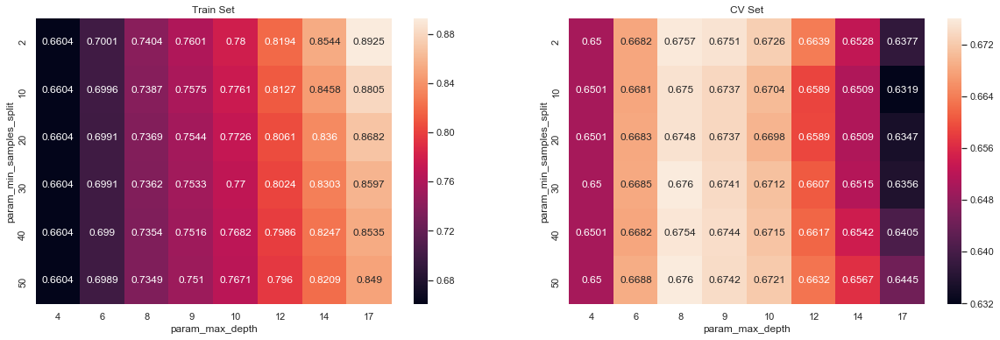

In [64]:
import seaborn as sns 
sns.set()
max_scores1 = pd.DataFrame(clf.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]

fig, ax = plt.subplots(1,2, figsize=(20,6))

sns.heatmap(max_scores1.mean_train_score, annot = True, fmt='.4g', ax=ax[0]) 
sns.heatmap(max_scores1.mean_test_score, annot = True, fmt='.4g', ax=ax[1]) 

ax[0].set_title('Train Set')
ax[1].set_title('CV Set')

plt.show()

#### Best Estimator and Best tune parameters

In [65]:
print(clf.best_estimator_)
#Mean cross-validated score of the best_estimator 
print(clf.score(X_tr,y_train)) 
print(clf.score(X_te,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=30,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7268922114108269
0.6839389702432386


In [78]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs
    
    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000 
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1]) 
    # we will be predicting for the last data points 
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

#### Fitting Model to Hyper-Parameter Curve -> Best Max_depth-> 8 , Best Min_sample_split-> 30

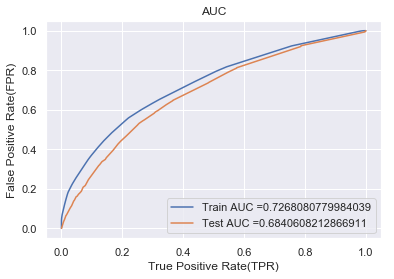

In [67]:
# https://scikitlearn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklea rn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

dt_bow = DecisionTreeClassifier(class_weight = 'balanced', max_depth=8, min_samples_split=30)

dt_bow.fit(X_tr, y_train) 
#https://scikitlearn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
#sklearn.linear_model.SGDClassifier.decision_function
y_train_pred = batch_predict(dt_bow, X_tr)
y_test_pred = batch_predict(dt_bow, X_te)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred) 
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr))) 
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)") 
plt.title("AUC")
plt.grid(True)
plt.show()

### D) Confusion matrix

In [79]:
def predict(proba, threshould, fpr, tpr):
    t = threshould[np.argmax(fpr*(1-tpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3)) 
    predictions = []
    global predictions1 
    for i in proba:
        if i>=t: 
            predictions.append(1)
        else: 
            predictions.append(0)
    predictions1 = predictions
    return predictions

### Train Data

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.44365461435039666 for threshold 0.437
[[ 4187  3239]
 [10773 30842]]
the maximum value of tpr*(1-fpr) 0.44365461435039666 for threshold 0.437


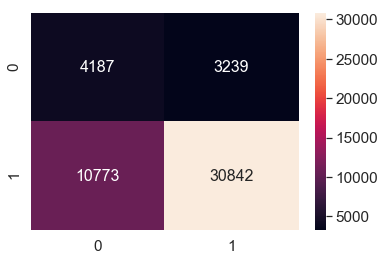

In [81]:
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_train_1 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_1, annot=True, annot_kws={"size": 16}, fmt='g')

#### Test Data

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.44365461435039666 for threshold 0.437
[[ 2830  2629]
 [ 8089 22504]]
the maximum value of tpr*(1-fpr) 0.44365461435039666 for threshold 0.437


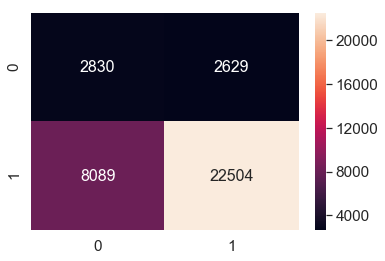

In [82]:
print("="*100)
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_test_1 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_1, annot=True,annot_kws={"size": 16}, fmt='g')

In [71]:
#Feature aggregation
f1 = vectorizer_cat.get_feature_names()
f2 = vectorizer_sub_cat.get_feature_names()
f3 = vectorizer_school_state.get_feature_names()
f4 = vectorizer_grade.get_feature_names()
f5 = vectorizer_teach_pre.get_feature_names()
fb = vectorizer_essay.get_feature_names()
ft = vectorizer_bow_title.get_feature_names()

feature_agg_bow = f1 + f2 + f3 + f4 + f5 + fb + ft 
# p is price, q is quantity, t is teacher previous year projects 
feature_agg_bow.append('price')  
feature_agg_bow.append('quantity')  
feature_agg_bow.append('teacher_previous_projects') 

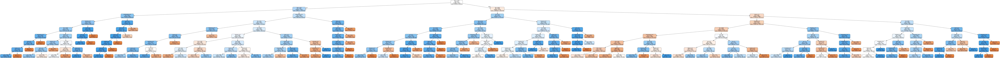

In [72]:
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
#dt_feat_names = list(X_test.columns)
#dt_target_names = [str(s) for s in [0,1]]
export_graphviz(dt_bow, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_bow)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())

#### Analysis on the False positives

In [73]:
#Get the False positives datapoints
X_test['essay'].values[1]

"My students are bright, talented young people from multicultural backgrounds. Although two have family members who speak French, none speak it at home. Their families have put them in this program believing that speaking another language fluently will be of great benefit to their future.\\r\\n\\r\\nOne of the boys wants to be a policeman in order to protect people.  He takes his role very seriously to protect the younger children in the class. Two others are artists, one loves to draw and the other makes amazing designs with colored shapes. Another boy is fascinated by science and building. One of the girls loves to read and devours all the books in class.\\r\\n\\r\\nThe French Immersion Program is part of a mainstream school in Minneapolis. We follow the same curriculum, except that it's translated in French, and the children go to the same art, music, and gym teachers as the rest of the school. All the children in the school receive free breakfast and lunch. There is a high proporti

In [83]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0) & (predictions1[i] == 1): 
        fpi.append(i)

fp_essay1 = [] 
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

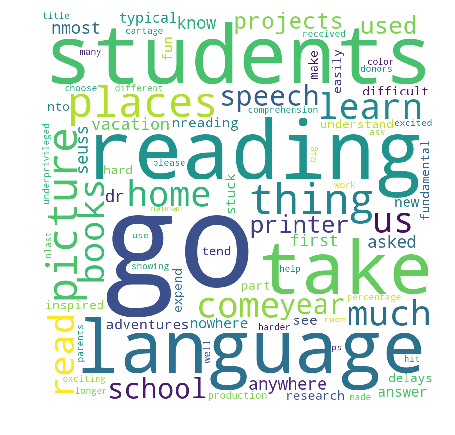

In [85]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1:
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower() 
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords =stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### DataFrame of False Positives

In [86]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

2629

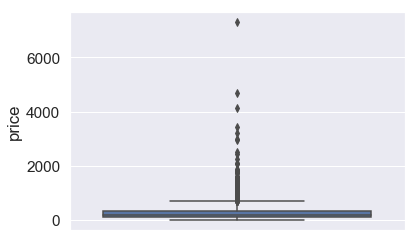

In [87]:
#Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

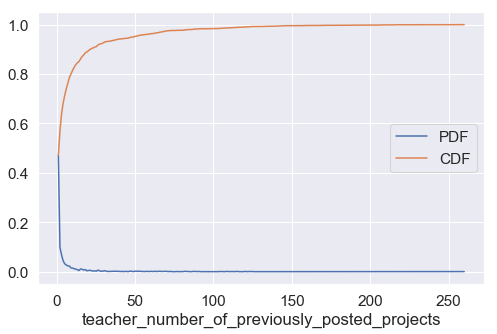

In [89]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"]) 
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

### 2.4.2 Applying Decision Trees on TFIDF,<font color='red'> SET 2</font>

In [96]:
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X_tr = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_categories_one_hot_train, project_grade_categories_one_hot_train, teacher_prefix_categories_one_hot_train, price_train, quantity_train, num_prev_proj_train, title_tfidf_train, text_tfidf_train)).tocsr()
X_te = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_categories_one_hot_test, project_grade_categories_one_hot_test, teacher_prefix_categories_one_hot_test, price_test, quantity_test, num_prev_proj_test, title_tfidf_test, text_tfidf_test)).tocsr()
X_cr = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_categories_one_hot_cv, project_grade_categories_one_hot_cv, teacher_prefix_categories_one_hot_cv, price_cv, quantity_cv, num_prev_proj_cv, title_tfidf_cv, text_tfidf_cv)).tocsr()

In [97]:
print("Final Data matrix") 
print(X_tr.shape, y_train.shape)  
print(X_te.shape, y_test.shape) 
print(X_cr.shape, y_cv.shape)

Final Data matrix
(49041, 14299) (49041,)
(36052, 14299) (36052,)
(24155, 14299) (24155,)


In [98]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dt2 = DecisionTreeClassifier(class_weight = 'balanced')
parameters = {'max_depth': [4, 6, 8, 9, 10, 12, 14, 17], 'min_samples_split': [2, 10, 20, 30, 40, 50]}
clf2 = GridSearchCV(dt2, parameters, cv=3, scoring='roc_auc') 
sel2 = clf2.fit(X_tr, y_train)

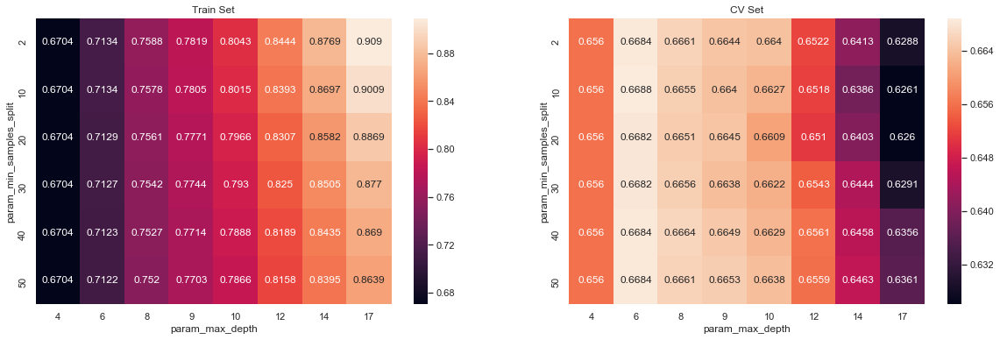

In [66]:
import seaborn as sns 
sns.set()
max_scores1 = pd.DataFrame(clf2.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]

fig, ax = plt.subplots(1,2, figsize=(20,6))

sns.heatmap(max_scores1.mean_train_score, annot = True, fmt='.4g', ax=ax[0]) 
sns.heatmap(max_scores1.mean_test_score, annot = True, fmt='.4g', ax=ax[1]) 

ax[0].set_title('Train Set')
ax[1].set_title('CV Set')

plt.show()

#### Best Estimator and Best tune parameters

In [67]:
print(clf2.best_estimator_)
#Mean cross-validated score of the best_estimator 
print(clf2.score(X_tr,y_train)) 
print(clf2.score(X_te,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=6,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=10,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7048631005382306
0.6785438521277529


#### Fitting Model to Hyper-Parameter Curve -> Best Max_depth-> 6 , Best Min_sample_split-> 10

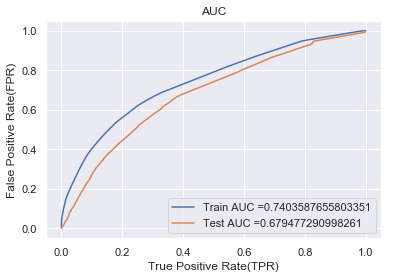

In [71]:
# https://scikitlearn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklea rn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

dt_tfidf = DecisionTreeClassifier(class_weight = 'balanced', max_depth=8, min_samples_split=30)

dt_tfidf.fit(X_tr, y_train) 
#https://scikitlearn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
#sklearn.linear_model.SGDClassifier.decision_function
y_train_pred = batch_predict(dt_tfidf, X_tr)
y_test_pred = batch_predict(dt_tfidf, X_te)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred) 
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr))) 
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)") 
plt.title("AUC")
plt.grid(True)
plt.show()

### Confusion Matrix

#### Train Data

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.46640496537279075 for threshold 0.378
[[ 4902  2524]
 [12746 28869]]
the maximum value of tpr*(1-fpr) 0.46640496537279075 for threshold 0.378


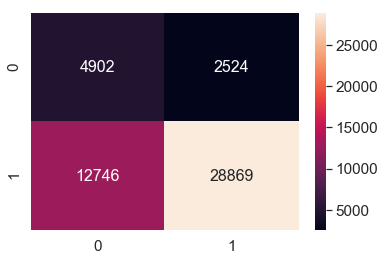

In [72]:
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_train_2 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_2, annot=True, annot_kws={"size": 16}, fmt='g')

#### Test Data

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.46640496537279075 for threshold 0.378
[[ 3321  2138]
 [ 9939 20654]]
the maximum value of tpr*(1-fpr) 0.46640496537279075 for threshold 0.378


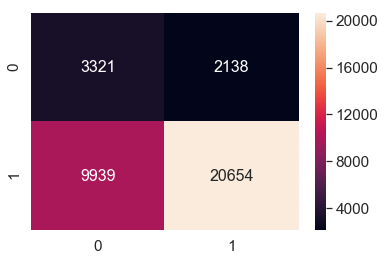

In [73]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_test_2 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_2, annot=True,annot_kws={"size": 16}, fmt='g')

In [74]:
#Feature aggregation
f1 = vectorizer_cat.get_feature_names()
f2 = vectorizer_sub_cat.get_feature_names()
f3 = vectorizer_school_state.get_feature_names()
f4 = vectorizer_grade.get_feature_names()
f5 = vectorizer_teach_pre.get_feature_names()
fb1 = vectorizer_tfidf_essay.get_feature_names()
ft1 = vectorizer_tfidf_title.get_feature_names()

feature_agg_tfidf = f1 + f2 + f3 + f4 + f5 + fb1 + ft1 
# p is price, q is quantity, t is teacher previous year projects 
feature_agg_tfidf.append('price')  
feature_agg_tfidf.append('quantity')  
feature_agg_tfidf.append('teacher_previous_projects') 

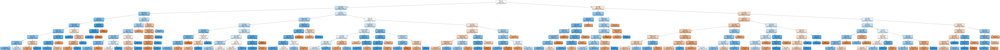

In [76]:
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
#dt_feat_names = list(X_test.columns)
#dt_target_names = [str(s) for s in [0,1]]
export_graphviz(dt_tfidf, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_tfidf)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())

#### Analysis on the False positives

In [77]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0) & (predictions1[i] == 1): 
        fpi.append(i)

fp_essay1 = [] 
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

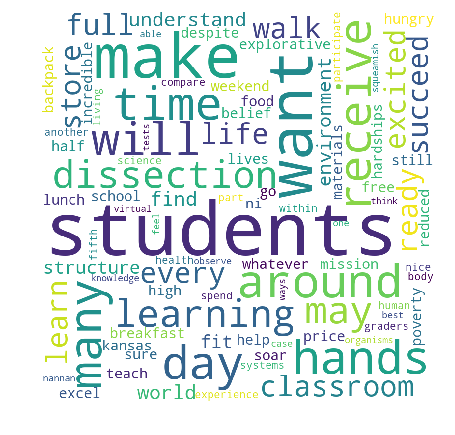

In [79]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1:
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower() 
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords =stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### DataFrame of False Positives

In [80]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

2138

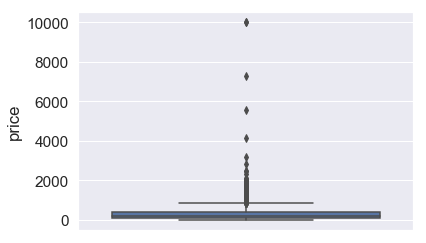

In [81]:
#Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

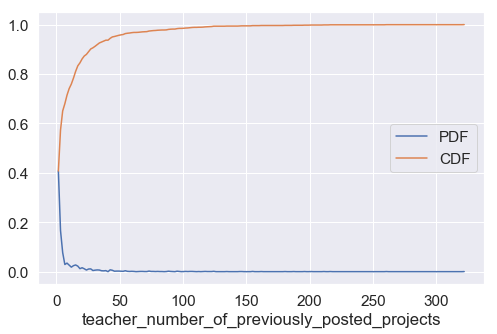

In [82]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"]) 
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

### 2.4.3 Applying Decision Trees on AVG W2V,<font color='red'> SET 3</font>

In [69]:
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X_tr = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_categories_one_hot_train, project_grade_categories_one_hot_train, teacher_prefix_categories_one_hot_train, price_train, quantity_train, num_prev_proj_train, avg_w2v_vectors_titles_train, avg_w2v_vectors_train)).tocsr()
X_te = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_categories_one_hot_test, project_grade_categories_one_hot_test, teacher_prefix_categories_one_hot_test, price_test, quantity_test, num_prev_proj_test, avg_w2v_vectors_titles_test, avg_w2v_vectors_test)).tocsr()
X_cr = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_categories_one_hot_cv, project_grade_categories_one_hot_cv, teacher_prefix_categories_one_hot_cv, price_cv, quantity_cv, num_prev_proj_cv, avg_w2v_vectors_titles_cv, avg_w2v_vectors_cv)).tocsr()

In [70]:
print("Final Data matrix") 
print(X_tr.shape, y_train.shape)  
print(X_te.shape, y_test.shape) 
print(X_cr.shape, y_cv.shape)

Final Data matrix
(49041, 702) (49041,)
(36052, 702) (36052,)
(24155, 702) (24155,)


In [71]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dt3 = DecisionTreeClassifier(class_weight = 'balanced')
parameters = {'max_depth': [4, 6, 8, 9, 10, 12, 14, 17], 'min_samples_split': [2, 10, 20, 30, 40, 50]}
clf3 = GridSearchCV(dt3, parameters, cv=3, scoring='roc_auc') 
sel3 = clf3.fit(X_tr, y_train)

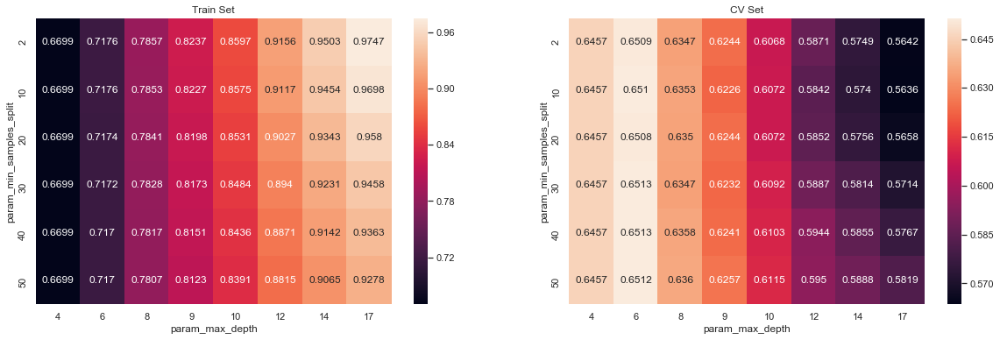

In [73]:
import seaborn as sns 
sns.set()
max_scores1 = pd.DataFrame(clf3.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]

fig, ax = plt.subplots(1,2, figsize=(20,6))

sns.heatmap(max_scores1.mean_train_score, annot = True, fmt='.4g', ax=ax[0]) 
sns.heatmap(max_scores1.mean_test_score, annot = True, fmt='.4g', ax=ax[1]) 

ax[0].set_title('Train Set')
ax[1].set_title('CV Set')

plt.show()

### Best Estimator and Best tune parameters

In [74]:
print(clf3.best_estimator_)
#Mean cross-validated score of the best_estimator 
print(clf3.score(X_tr,y_train)) 
print(clf3.score(X_te,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=6,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=30,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7074226541315217
0.6474902125020524


### Fitting Model to Hyper-Parameter Curve -> Best Max_depth-> 6 , Best Min_sample_split-> 30

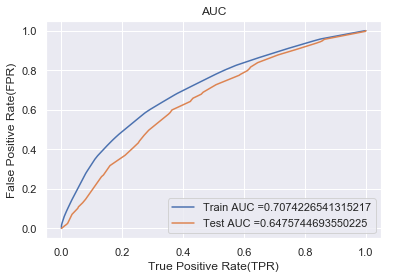

In [77]:
dt_avg_w2v = DecisionTreeClassifier(class_weight = 'balanced', max_depth=6, min_samples_split=30)

dt_avg_w2v.fit(X_tr, y_train) 
#https://scikitlearn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
#sklearn.linear_model.SGDClassifier.decision_function
y_train_pred = batch_predict(dt_avg_w2v, X_tr)
y_test_pred = batch_predict(dt_avg_w2v, X_te)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred) 
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr))) 
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)") 
plt.title("AUC")
plt.grid(True)
plt.show()

### Confusion Matrix

#### Train Data

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.4271204831561834 for threshold 0.475
[[ 4666  2760]
 [13518 28097]]
the maximum value of tpr*(1-fpr) 0.4271204831561834 for threshold 0.475


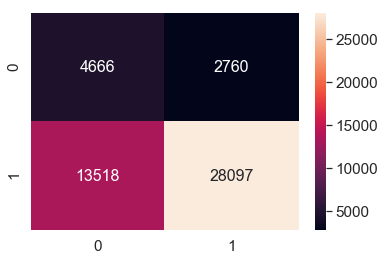

In [78]:
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_train_2 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_2, annot=True, annot_kws={"size": 16}, fmt='g')

#### Test Data

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.4271204831561834 for threshold 0.475
[[ 2952  2507]
 [ 9828 20765]]
the maximum value of tpr*(1-fpr) 0.4271204831561834 for threshold 0.475


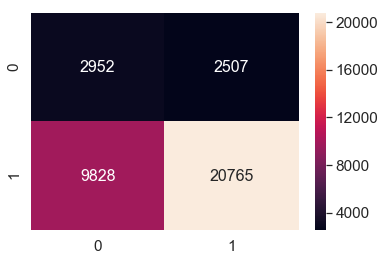

In [79]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_test_2 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_2, annot=True,annot_kws={"size": 16}, fmt='g')

In [80]:
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0) & (predictions1[i] == 1): 
        fpi.append(i)

fp_essay1 = [] 
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

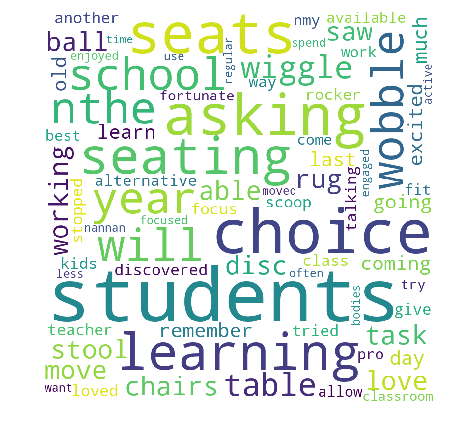

In [82]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1:
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower() 
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords =stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [83]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

2507

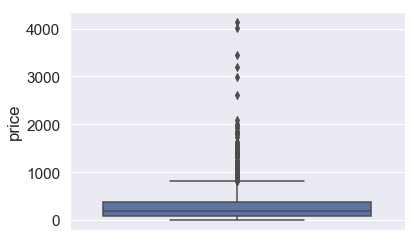

In [84]:
#Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

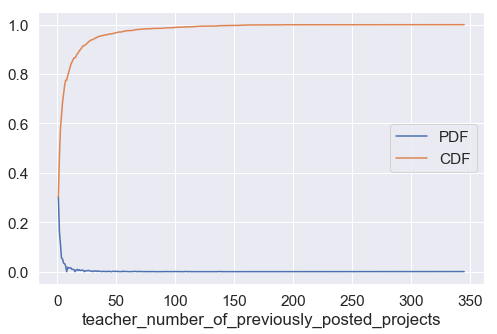

In [85]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"]) 
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

### 2.4.4 Applying Decision Trees on TFIDF W2V,<font color='red'> SET 4</font>

In [72]:
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X_tr = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_categories_one_hot_train, project_grade_categories_one_hot_train, teacher_prefix_categories_one_hot_train, price_train, quantity_train, num_prev_proj_train, tfidf_w2v_vectors_titles_train, tfidf_w2v_vectors_train)).tocsr()
X_te = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_categories_one_hot_test, project_grade_categories_one_hot_test, teacher_prefix_categories_one_hot_test, price_test, quantity_test, num_prev_proj_test, tfidf_w2v_vectors_titles_test, tfidf_w2v_vectors_test)).tocsr()
X_cr = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_categories_one_hot_cv, project_grade_categories_one_hot_cv, teacher_prefix_categories_one_hot_cv, price_cv, quantity_cv, num_prev_proj_cv, tfidf_w2v_vectors_titles_cv, tfidf_w2v_vectors_cv)).tocsr()

In [73]:
print("Final Data matrix") 
print(X_tr.shape, y_train.shape)  
print(X_te.shape, y_test.shape) 
print(X_cr.shape, y_cv.shape)

Final Data matrix
(49041, 702) (49041,)
(36052, 702) (36052,)
(24155, 702) (24155,)


In [74]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dt4 = DecisionTreeClassifier(class_weight = 'balanced')
parameters = {'max_depth': [4, 6, 8, 9, 10, 12, 14, 17], 'min_samples_split': [2, 10, 20, 30, 40, 50]}
clf4 = GridSearchCV(dt4, parameters, cv=3, scoring='roc_auc') 
sel4 = clf4.fit(X_tr, y_train)

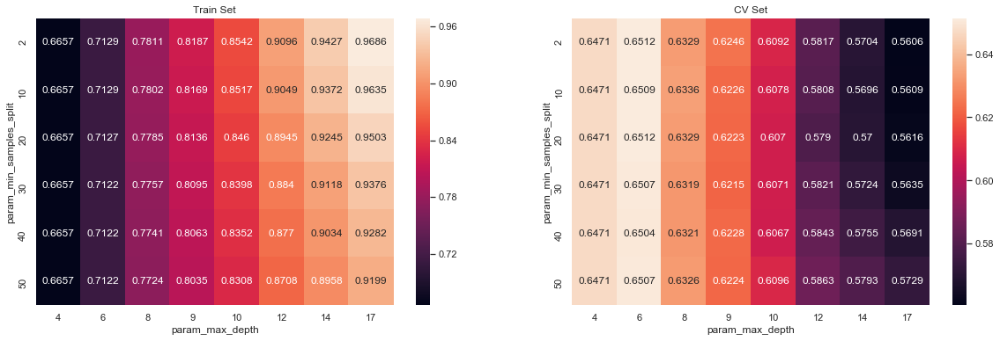

In [75]:
import seaborn as sns 
sns.set()
max_scores1 = pd.DataFrame(clf4.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]

fig, ax = plt.subplots(1,2, figsize=(20,6))

sns.heatmap(max_scores1.mean_train_score, annot = True, fmt='.4g', ax=ax[0]) 
sns.heatmap(max_scores1.mean_test_score, annot = True, fmt='.4g', ax=ax[1]) 

ax[0].set_title('Train Set')
ax[1].set_title('CV Set')

plt.show()

### Best Estimator and Best tune parameters

In [76]:
print(clf4.best_estimator_)
#Mean cross-validated score of the best_estimator 
print(clf4.score(X_tr,y_train)) 
print(clf4.score(X_te,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=6,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7011691567298365
0.6582113020082184


### Fitting Model to Hyper-Parameter Curve -> Best Max_depth-> 6 , Best Min_sample_split-> 2

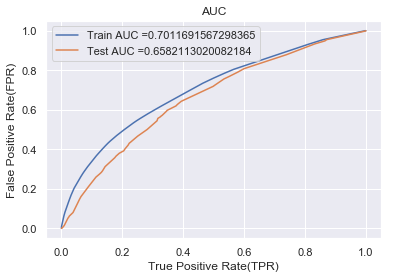

In [80]:
dt_tfidf_w2v = DecisionTreeClassifier(class_weight = 'balanced', max_depth=6, min_samples_split=2)

dt_tfidf_w2v.fit(X_tr, y_train) 
#https://scikitlearn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
#sklearn.linear_model.SGDClassifier.decision_function
y_train_pred = batch_predict(dt_tfidf_w2v, X_tr)
y_test_pred = batch_predict(dt_tfidf_w2v, X_te)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred) 
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr))) 
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)") 
plt.title("AUC")
plt.grid(True)
plt.show()

### Confusion Matrix

#### Train Data

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.4160942622986627 for threshold 0.459
[[ 4370  3056]
 [12913 28702]]
the maximum value of tpr*(1-fpr) 0.4160942622986627 for threshold 0.459


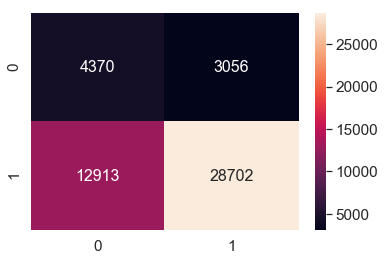

In [81]:
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_train_4 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_4, annot=True, annot_kws={"size": 16}, fmt='g')

#### Test Data

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.4160942622986627 for threshold 0.459
[[ 2738  2721]
 [ 8612 21981]]
the maximum value of tpr*(1-fpr) 0.4160942622986627 for threshold 0.459


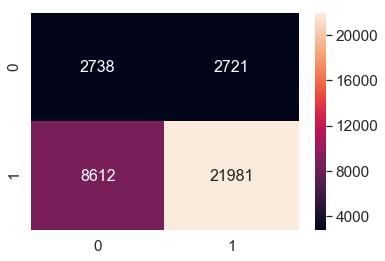

In [82]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_test_4 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_4, annot=True,annot_kws={"size": 16}, fmt='g')

In [83]:
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0) & (predictions1[i] == 1): 
        fpi.append(i)

fp_essay1 = [] 
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

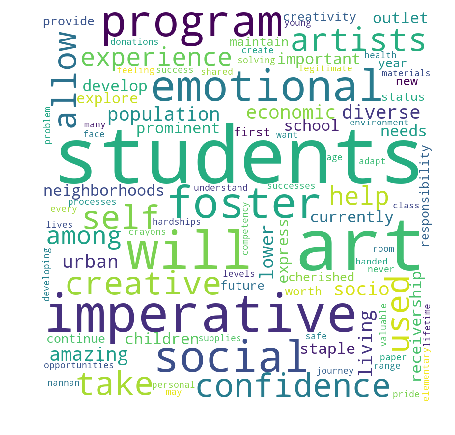

In [84]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1:
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower() 
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords =stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [85]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

2721

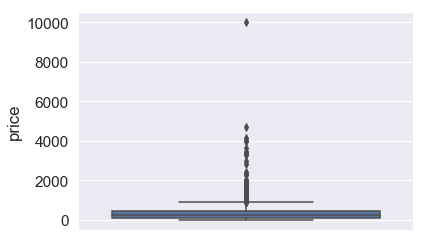

In [86]:
#Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

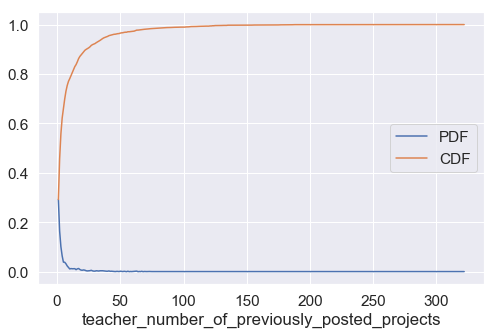

In [87]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"]) 
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

<h2>2.5 [Task-2]Getting top 5k features using `feature_importances_`</h2>

In [99]:
#https://stackoverflow.com/questions/47111434/randomforestregressor-and-feature-importa nces-error
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV 
def selectKImportance(model, X, k=5):
    return X[:,model.best_estimator_.feature_importances_.argsort()[::-1][:k]]

In [101]:
# for tf-idf set 2
X_set5_train = selectKImportance(clf2, X_tr, 5000)
X_set5_test = selectKImportance(clf2, X_te, 5000)
print(X_set5_train.shape)
print(X_set5_test.shape)

(49041, 5000)
(36052, 5000)


### Decision tree on Important features

In [102]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dt5 = DecisionTreeClassifier(class_weight = 'balanced')
parameters = {'max_depth': [4, 6, 8, 9, 10, 12, 14, 17], 'min_samples_split': [2, 10, 20, 30, 40, 50]}
clf5 = GridSearchCV(dt5, parameters, cv=3, scoring='roc_auc') 
sel5 = clf5.fit(X_set5_train, y_train)

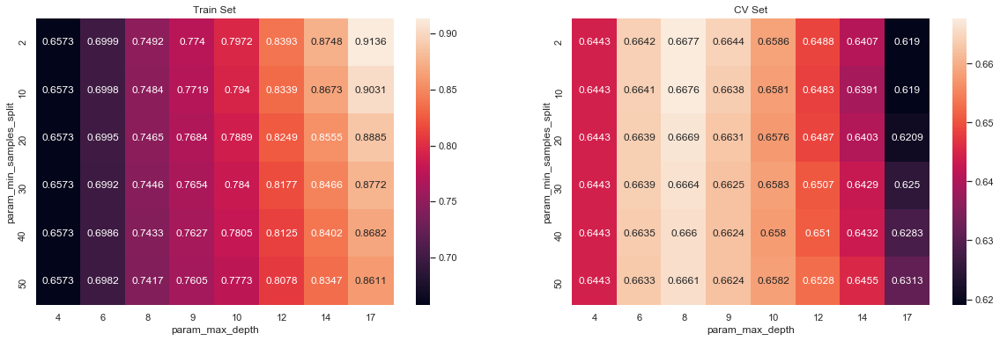

In [103]:
import seaborn as sns 
sns.set()
max_scores1 = pd.DataFrame(clf5.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]

fig, ax = plt.subplots(1,2, figsize=(20,6))

sns.heatmap(max_scores1.mean_train_score, annot = True, fmt='.4g', ax=ax[0]) 
sns.heatmap(max_scores1.mean_test_score, annot = True, fmt='.4g', ax=ax[1]) 

ax[0].set_title('Train Set')
ax[1].set_title('CV Set')

plt.show()

### Best Estimator and Best tune parameters

In [104]:
print(clf5.best_estimator_)
#Mean cross-validated score of the best_estimator 
print(clf5.score(X_set5_train,y_train)) 
print(clf5.score(X_set5_test,y_test))

DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7420172778317292
0.6720484939369704


### Fitting Model to Hyper-Parameter Curve -> Best Max_depth-> 8 , Best Min_sample_split-> 2

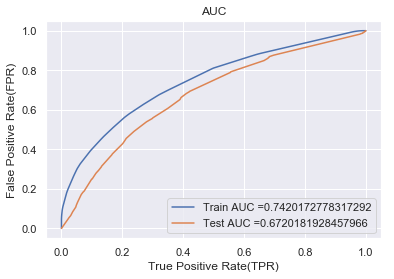

In [106]:
dt_tfidf_set5 = DecisionTreeClassifier(class_weight = 'balanced', max_depth=8, min_samples_split=2)

dt_tfidf_set5.fit(X_set5_train, y_train) 
#https://scikitlearn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
#sklearn.linear_model.SGDClassifier.decision_function
y_train_pred = batch_predict(dt_tfidf_set5, X_set5_train)
y_test_pred = batch_predict(dt_tfidf_set5, X_set5_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred) 
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr))) 
plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("True Positive Rate(TPR)")
plt.ylabel("False Positive Rate(FPR)") 
plt.title("AUC")
plt.grid(True)
plt.show()

### Confusion Matrix

#### Train Data

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.45939493385479657 for threshold 0.431
[[ 4780  2646]
 [12325 29290]]
the maximum value of tpr*(1-fpr) 0.45939493385479657 for threshold 0.431


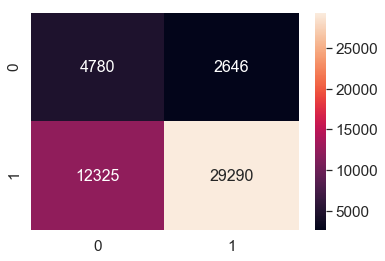

In [107]:
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_train_5 = pd.DataFrame(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_train_5, annot=True, annot_kws={"size": 16}, fmt='g')

#### Test Data

Test confusion matrix
the maximum value of tpr*(1-fpr) 0.45939493385479657 for threshold 0.431
[[ 3164  2295]
 [ 9407 21186]]
the maximum value of tpr*(1-fpr) 0.45939493385479657 for threshold 0.431


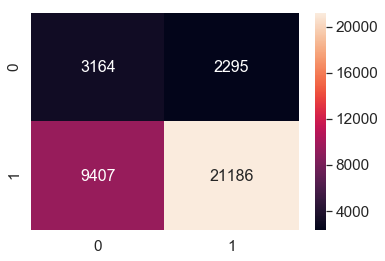

In [108]:
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)))

conf_matr_df_test_4 = pd.DataFrame(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, train_fpr, train_tpr)), range(2),range(2))

sns.set(font_scale=1.4)#for label size
sns.heatmap(conf_matr_df_test_4, annot=True,annot_kws={"size": 16}, fmt='g')

In [109]:
fpi = []
for i in range(len(y_test)):
    if (y_test.values[i] == 0) & (predictions1[i] == 1): 
        fpi.append(i)

fp_essay1 = [] 
for i in fpi:
    fp_essay1.append(X_test['essay'].values[i])

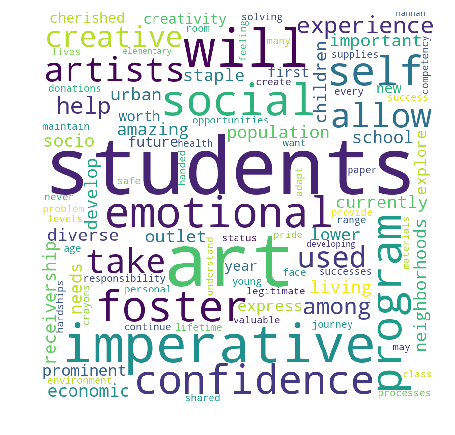

In [110]:
from wordcloud import WordCloud, STOPWORDS 
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay1:
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower() 
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords =stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [111]:
# first get the columns:
cols = X_test.columns
X_test_falsePos1 = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos1 = X_test_falsePos1.append(X_test.filter(items=[i], axis=0))

X_test_falsePos1.head(1)
len(X_test_falsePos1)

2295

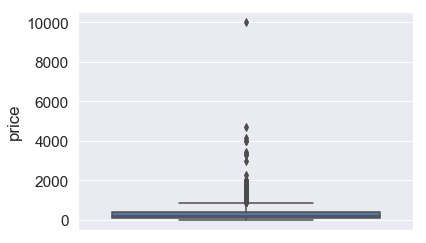

In [112]:
#Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos1)

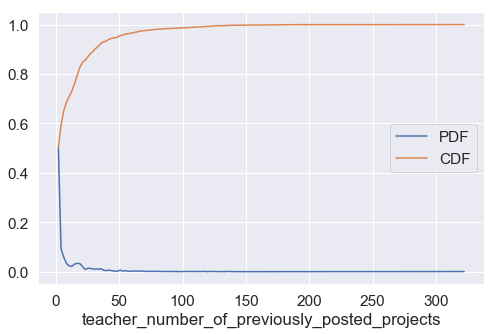

In [113]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos1['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"]) 
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

<h1>3. Conclusion</h1>

In [114]:
from prettytable import PrettyTable
tb = PrettyTable()
tb.field_names= (" Vectorizer ", " Max_depth ", " Min_sample_split "," Test -AUC ") 
tb.add_row([" BOW ", 8, 30, 0.68])
tb.add_row([" TFIDF ", 6, 10, 0.68])
tb.add_row([" AVG-W2V ", 6, 30, 0.65])
tb.add_row([" TFIDF W2V ", 6, 2, 0.66])
tb.add_row(["Top 5000 Features", 8, 2, 0.67])
print(tb.get_string(titles = "Decision trees- Observations"))

+-------------------+-------------+--------------------+-------------+
|     Vectorizer    |  Max_depth  |  Min_sample_split  |  Test -AUC  |
+-------------------+-------------+--------------------+-------------+
|        BOW        |      8      |         30         |     0.68    |
|       TFIDF       |      6      |         10         |     0.68    |
|      AVG-W2V      |      6      |         30         |     0.65    |
|     TFIDF W2V     |      6      |         2          |     0.66    |
| Top 5000 Features |      8      |         2          |     0.67    |
+-------------------+-------------+--------------------+-------------+
